In [7]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt

# Data Preprocessing

### **Normalization**: The pixel values are scaled to the range [0, 1] for better training. Normalization helps in speeding up the convergence during training.

### **Reshape**: The images are reshaped to include a channel dimension (for grayscale images), making it compatible with the neural network input.

In [8]:
# Load MNIST dataset
(X_train, _), (_, _) = tf.keras.datasets.mnist.load_data()
X_train = (X_train.astype(np.float32) - 127.5) / 127.5  # Normalize to [-1, 1]
X_train = np.expand_dims(X_train, axis=-1)

# Build the Generator Model

### **Dense Layers:** The generator takes a random noise vector of size 100 as input and generates a 28x28 image. The first layer transforms the noise into a larger representation.

### **Activation Functions:** ReLU (Rectified Linear Unit) is used for the hidden layer, and sigmoid is used for the output layer to ensure pixel values are in the [0, 1] range.

In [16]:
# Generator model
def build_generator():
    model = tf.keras.Sequential()
    model.add(layers.Dense(256, input_dim=100))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.Dense(512))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.Dense(1024))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.Dense(28 * 28 * 1, activation='tanh'))
    model.add(layers.Reshape((28, 28, 1)))
    return model

generator = build_generator()
generator.summary()

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_61 (Dense)            (None, 256)               25856     
                                                                 
 leaky_re_lu_44 (LeakyReLU)  (None, 256)               0         
                                                                 
 batch_normalization_30 (Ba  (None, 256)               1024      
 tchNormalization)                                               
                                                                 
 dense_62 (Dense)            (None, 512)               131584    
                                                                 
 leaky_re_lu_45 (LeakyReLU)  (None, 512)               0         
                                                                 
 batch_normalization_31 (Ba  (None, 512)               2048      
 tchNormalization)                                   

# Build the Discriminator Model

### **Flatten Layer:** The discriminator processes images by flattening them into a 1D vector before feeding them into fully connected layers.

### **Output Layer:** The output is a single value between 0 and 1, representing the probability that the input image is real.

In [17]:
# Discriminator model
def build_discriminator():
    model = tf.keras.Sequential()
    model.add(layers.Flatten(input_shape=(28, 28, 1)))
    model.add(layers.Dense(512))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dense(256))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

discriminator = build_discriminator()
discriminator.summary()

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_7 (Flatten)         (None, 784)               0         
                                                                 
 dense_65 (Dense)            (None, 512)               401920    
                                                                 
 leaky_re_lu_47 (LeakyReLU)  (None, 512)               0         
                                                                 
 dense_66 (Dense)            (None, 256)               131328    
                                                                 
 leaky_re_lu_48 (LeakyReLU)  (None, 256)               0         
                                                                 
 dense_67 (Dense)            (None, 1)                 257       
                                                                 
Total params: 533505 (2.04 MB)
Trainable params: 5335

# Compile the Models & Train the Model

### **Loss Function:** Binary cross-entropy is used because it is a binary classification problem (real vs. fake).

### **Optimizer:** Adam optimizer is chosen for its efficiency in training deep learning models.

### **Epochs:** The GAN is trained for a set number of epochs, with each epoch consisting of generating images and training the models.

### **Noise Generation:** Random noise is generated for the generator to create fake images.

In [18]:
# Compile GAN
def build_gan(generator, discriminator):
    discriminator.compile(optimizer=tf.keras.optimizers.Adam(0.0002), loss='binary_crossentropy', metrics=['accuracy'])
    discriminator.trainable = False
    gan_input = layers.Input(shape=(100,))
    generated_img = generator(gan_input)
    gan_output = discriminator(generated_img)
    gan = tf.keras.Model(gan_input, gan_output)
    gan.compile(optimizer=tf.keras.optimizers.Adam(0.0002), loss='binary_crossentropy')
    return gan

# Build models
generator = build_generator()
discriminator = build_discriminator()
gan = build_gan(generator, discriminator)

# Training function
def train(epochs, batch_size=128, save_interval=200):
    real = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))

    for epoch in range(epochs):
        idx = np.random.randint(0, X_train.shape[0], batch_size)
        real_imgs = X_train[idx]

        noise = np.random.normal(0, 1, (batch_size, 100))
        gen_imgs = generator.predict(noise)

        d_loss_real = discriminator.train_on_batch(real_imgs, real)
        d_loss_fake = discriminator.train_on_batch(gen_imgs, fake)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

        g_loss = gan.train_on_batch(noise, real)

        if epoch % save_interval == 0:
            print(f"{epoch} [D loss: {d_loss[0]}, acc.: {100 * d_loss[1]}%] [G loss: {g_loss}]")
            save_imgs(epoch)

# Image Generation and Visualization

2/2 [==============================] - 0s 6ms/step
0 [D loss: 0.7076970040798187, acc.: 41.40625%] [G loss: 0.6082689762115479]
1/1 [==============================] - 0s 115ms/step


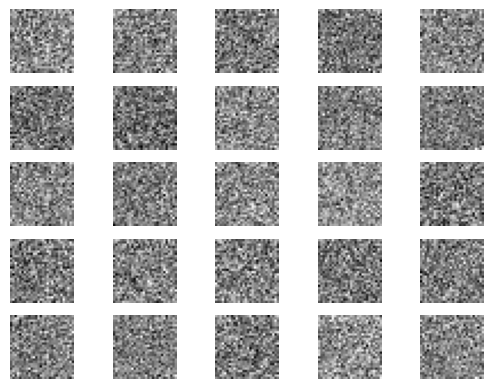

2/2 [==============================] - 0s 4ms/step


In [12]:
# Function to save generated images
def save_imgs(epoch):
    noise = np.random.normal(0, 1, (25, 100))
    gen_imgs = generator.predict(noise)
    gen_imgs = 0.5 * gen_imgs + 0.5  # Rescale to [0, 1]
    fig, axs = plt.subplots(5, 5)
    cnt = 0
    for i in range(5):
        for j in range(5):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    plt.show()

# Train the GAN
train(epochs=1000, batch_size=64, save_interval=1000)

# Question 01

## **Modify the latent space size (e.g., change the noise vector size from 100 to 50 or 200) and observe how this change affects the quality and variety of generated images.**

---

# Question 02

## **Train the GAN for 10,000 epochs. Save and visualize the generated images at every 1000 epochs, then create a GIF or a slideshow to show how the quality of the generated images evolves over time.**

---

# Question 03

## **Change the optimizer from Adam to RMSprop or SGD for both the generator and discriminator, and observe the impact on training performance and image quality.**

---

# Question 04

## **Experiment with different values of the batch_size. What impact does it have on training?**







# Question 01
Modify the latent space size (e.g., change the noise vector size from 100 to 50 or 200) and observe how this change affects the quality and variety of generated images.

### Latent Space Size of 50

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_28 (Dense)            (None, 256)               13056     
                                                                 
 leaky_re_lu_20 (LeakyReLU)  (None, 256)               0         
                                                                 
 batch_normalization_12 (Ba  (None, 256)               1024      
 tchNormalization)                                               
                                                                 
 dense_29 (Dense)            (None, 512)               131584    
                                                                 
 leaky_re_lu_21 (LeakyReLU)  (None, 512)               0         
                                                                 
 batch_normalization_13 (Ba  (None, 512)               2048      
 tchNormalization)                                    

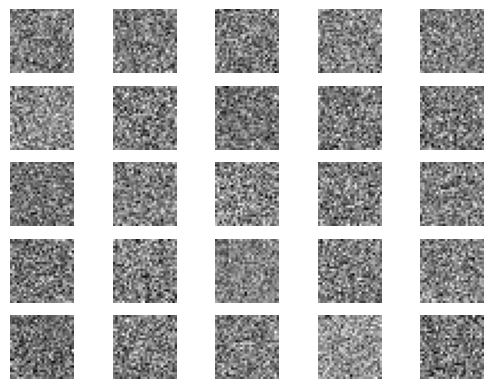

2/2 [==============================] - 0s 5ms/step


In [13]:
latent_dim = 50

# Generator model
def build_generator():
    model = tf.keras.Sequential()
    model.add(layers.Dense(256, input_dim=latent_dim))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.Dense(512))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.Dense(1024))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.Dense(28 * 28 * 1, activation='tanh'))
    model.add(layers.Reshape((28, 28, 1)))
    return model

generator = build_generator()
generator.summary()


# Compile GAN
def build_gan(generator, discriminator):
    discriminator.compile(optimizer=tf.keras.optimizers.Adam(0.0002), loss='binary_crossentropy', metrics=['accuracy'])
    discriminator.trainable = False
    gan_input = layers.Input(shape=(latent_dim,))
    generated_img = generator(gan_input)
    gan_output = discriminator(generated_img)
    gan = tf.keras.Model(gan_input, gan_output)
    gan.compile(optimizer=tf.keras.optimizers.Adam(0.0002), loss='binary_crossentropy')
    return gan

# Build models
generator = build_generator()
discriminator = build_discriminator()
gan = build_gan(generator, discriminator)

# Training function
def train(epochs, batch_size=128, save_interval=200):
    real = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))

    for epoch in range(epochs):
        idx = np.random.randint(0, X_train.shape[0], batch_size)
        real_imgs = X_train[idx]

        noise = np.random.normal(0, 1, (batch_size, latent_dim))
        gen_imgs = generator.predict(noise)

        d_loss_real = discriminator.train_on_batch(real_imgs, real)
        d_loss_fake = discriminator.train_on_batch(gen_imgs, fake)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

        g_loss = gan.train_on_batch(noise, real)

        if epoch % save_interval == 0:
            print(f"{epoch} [D loss: {d_loss[0]}, acc.: {100 * d_loss[1]}%] [G loss: {g_loss}]")
            save_imgs(epoch)

# Function to save generated images
def save_imgs(epoch):
    noise = np.random.normal(0, 1, (25, latent_dim))
    gen_imgs = generator.predict(noise)
    gen_imgs = 0.5 * gen_imgs + 0.5  # Rescale to [0, 1]
    fig, axs = plt.subplots(5, 5)
    cnt = 0
    for i in range(5):
        for j in range(5):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    plt.show()

# Train the GAN
train(epochs=1000, batch_size=64, save_interval=1000)

### Latent Space Size of 200

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_50 (Dense)            (None, 256)               51456     
                                                                 
 leaky_re_lu_36 (LeakyReLU)  (None, 256)               0         
                                                                 
 batch_normalization_24 (Ba  (None, 256)               1024      
 tchNormalization)                                               
                                                                 
 dense_51 (Dense)            (None, 512)               131584    
                                                                 
 leaky_re_lu_37 (LeakyReLU)  (None, 512)               0         
                                                                 
 batch_normalization_25 (Ba  (None, 512)               2048      
 tchNormalization)                                   

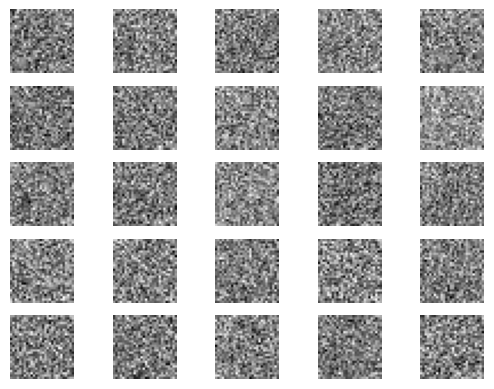

2/2 [==============================] - 0s 5ms/step


In [15]:
latent_dim = 200

# Generator model
def build_generator():
    model = tf.keras.Sequential()
    model.add(layers.Dense(256, input_dim=latent_dim))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.Dense(512))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.Dense(1024))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.Dense(28 * 28 * 1, activation='tanh'))
    model.add(layers.Reshape((28, 28, 1)))
    return model

generator = build_generator()
generator.summary()


# Compile GAN
def build_gan(generator, discriminator):
    discriminator.compile(optimizer=tf.keras.optimizers.Adam(0.0002), loss='binary_crossentropy', metrics=['accuracy'])
    discriminator.trainable = False
    gan_input = layers.Input(shape=(latent_dim,))
    generated_img = generator(gan_input)
    gan_output = discriminator(generated_img)
    gan = tf.keras.Model(gan_input, gan_output)
    gan.compile(optimizer=tf.keras.optimizers.Adam(0.0002), loss='binary_crossentropy')
    return gan

# Build models
generator = build_generator()
discriminator = build_discriminator()
gan = build_gan(generator, discriminator)

# Training function
def train(epochs, batch_size=128, save_interval=200):
    real = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))

    for epoch in range(epochs):
        idx = np.random.randint(0, X_train.shape[0], batch_size)
        real_imgs = X_train[idx]

        noise = np.random.normal(0, 1, (batch_size, latent_dim))
        gen_imgs = generator.predict(noise)

        d_loss_real = discriminator.train_on_batch(real_imgs, real)
        d_loss_fake = discriminator.train_on_batch(gen_imgs, fake)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

        g_loss = gan.train_on_batch(noise, real)

        if epoch % save_interval == 0:
            print(f"{epoch} [D loss: {d_loss[0]}, acc.: {100 * d_loss[1]}%] [G loss: {g_loss}]")
            save_imgs(epoch)

# Function to save generated images
def save_imgs(epoch):
    noise = np.random.normal(0, 1, (25, latent_dim))
    gen_imgs = generator.predict(noise)
    gen_imgs = 0.5 * gen_imgs + 0.5  # Rescale to [0, 1]
    fig, axs = plt.subplots(5, 5)
    cnt = 0
    for i in range(5):
        for j in range(5):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    plt.show()

# Train the GAN
train(epochs=1000, batch_size=64, save_interval=1000)

# Question 02
Train the GAN for 10,000 epochs. Save and visualize the generated images at every 1000 epochs, then create a GIF or a slideshow to show how the quality of the generated images evolves over time.

In [29]:
def save_imgs(epoch):
    noise = np.random.normal(0, 1, (25, 100))
    gen_imgs = generator.predict(noise)
    gen_imgs = 0.5 * gen_imgs + 0.5  # Rescale to [0, 1]

    fig, axs = plt.subplots(5, 5)
    cnt = 0
    for i in range(5):
        for j in range(5):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

    # Save the figure before showing it
    if not os.path.exists('images'):
        os.makedirs('images')
    fig.savefig(f"images/epoch_{epoch}.png")

    plt.show()
    plt.close()

2/2 [==============================] - 0s 5ms/step
0 [D loss: 0.6130216717720032, acc.: 70.3125%] [G loss: 0.8017042279243469]
1/1 [==============================] - 0s 28ms/step


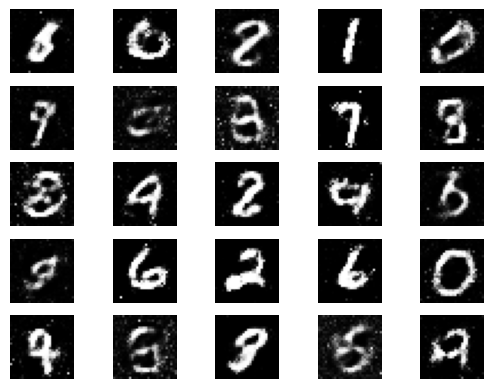

2/2 [==============================] - 0s 6ms/step
1000 [D loss: 0.7172532081604004, acc.: 47.65625%] [G loss: 0.810210108757019]
1/1 [==============================] - 0s 26ms/step


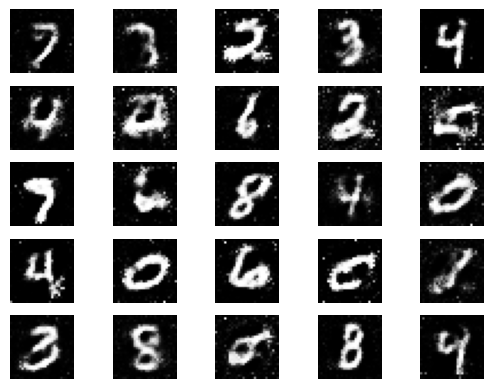

2/2 [==============================] - 0s 5ms/step
2000 [D loss: 0.5989710986614227, acc.: 67.96875%] [G loss: 1.0272908210754395]
1/1 [==============================] - 0s 27ms/step


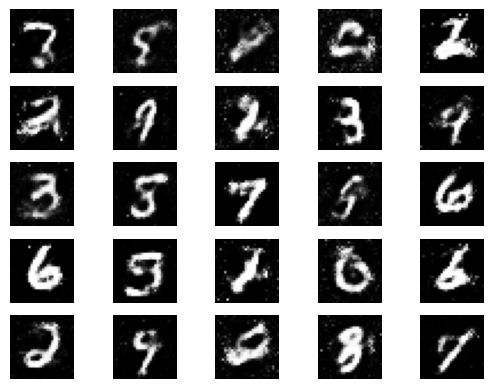

2/2 [==============================] - 0s 5ms/step
3000 [D loss: 0.746651828289032, acc.: 53.90625%] [G loss: 0.7949008941650391]
1/1 [==============================] - 0s 25ms/step


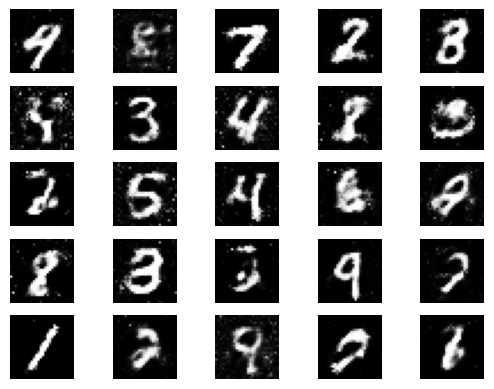

2/2 [==============================] - 0s 6ms/step
4000 [D loss: 0.5741302669048309, acc.: 74.21875%] [G loss: 1.121137261390686]
1/1 [==============================] - 0s 35ms/step


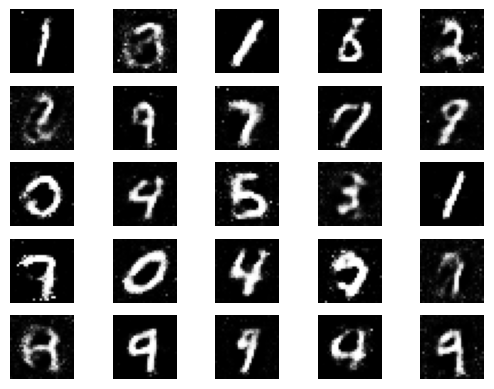

2/2 [==============================] - 0s 5ms/step
5000 [D loss: 0.5386605560779572, acc.: 70.3125%] [G loss: 1.056287407875061]
1/1 [==============================] - 0s 31ms/step


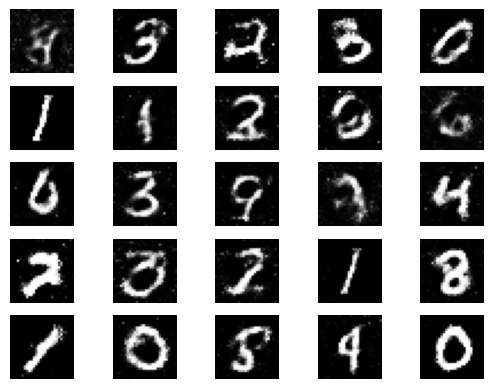

2/2 [==============================] - 0s 5ms/step
6000 [D loss: 0.5877499878406525, acc.: 73.4375%] [G loss: 1.0755798816680908]
1/1 [==============================] - 0s 29ms/step


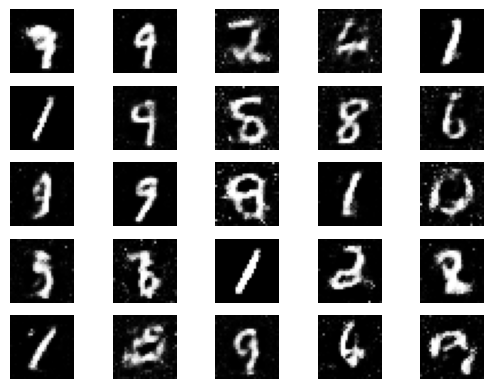

2/2 [==============================] - 0s 5ms/step
7000 [D loss: 0.7205669581890106, acc.: 57.03125%] [G loss: 0.8801629543304443]
1/1 [==============================] - 0s 27ms/step


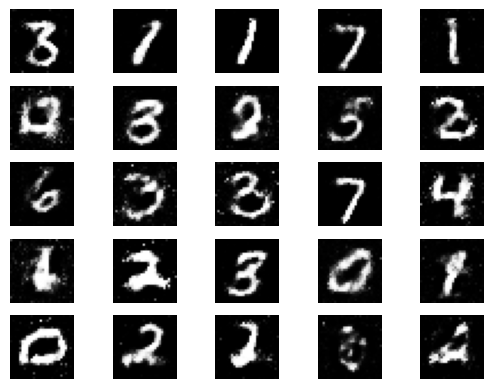

2/2 [==============================] - 0s 5ms/step
8000 [D loss: 0.5534870028495789, acc.: 73.4375%] [G loss: 1.1299424171447754]
1/1 [==============================] - 0s 27ms/step


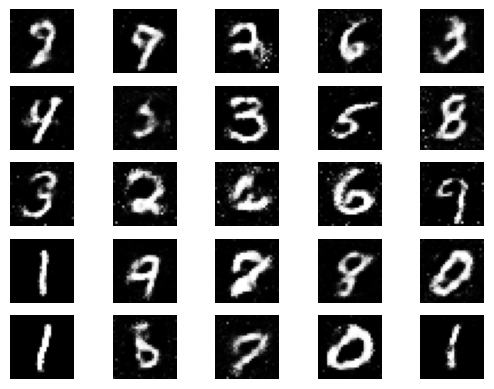

2/2 [==============================] - 0s 5ms/step
9000 [D loss: 0.5502848774194717, acc.: 73.4375%] [G loss: 1.1590192317962646]
1/1 [==============================] - 0s 25ms/step


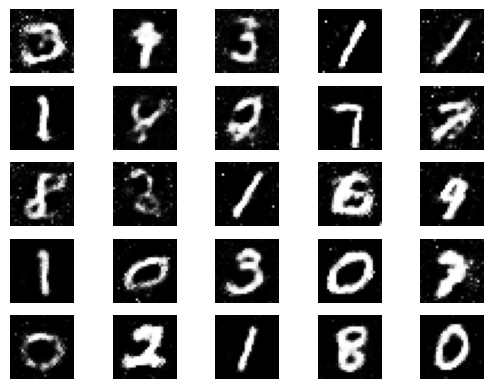

2/2 [==============================] - 0s 5ms/step


In [30]:
train(epochs=10000, batch_size=64, save_interval=1000)

In [33]:
import imageio

images = []
for epoch in range(0, 9001, 1000):
    images.append(imageio.imread(f"images/epoch_{epoch}.png"))
imageio.mimsave('training_progress.gif', images, fps=1)

<ipython-input-33-c92f7624fc4e>:5: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(f"images/epoch_{epoch}.png"))


# Question 03
Change the optimizer from Adam to RMSprop or SGD for both the generator and discriminator, and observe the impact on training performance and image quality.

#### RMSprop

In [43]:
# Generator model
def build_generator():
    model = tf.keras.Sequential()
    model.add(layers.Dense(256, input_dim=100))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.Dense(512))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.Dense(1024))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.Dense(28 * 28 * 1, activation='tanh'))
    model.add(layers.Reshape((28, 28, 1)))
    return model

# Discriminator model
def build_discriminator():
    model = tf.keras.Sequential()
    model.add(layers.Flatten(input_shape=(28, 28, 1)))
    model.add(layers.Dense(512))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dense(256))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

# Training function
def train(epochs, batch_size=128, save_interval=200):
    real = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))

    for epoch in range(epochs):
        idx = np.random.randint(0, X_train.shape[0], batch_size)
        real_imgs = X_train[idx]

        noise = np.random.normal(0, 1, (batch_size, 100))
        gen_imgs = generator.predict(noise)

        d_loss_real = discriminator.train_on_batch(real_imgs, real)
        d_loss_fake = discriminator.train_on_batch(gen_imgs, fake)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

        g_loss = gan.train_on_batch(noise, real)

        if epoch % save_interval == 0:
            print(f"{epoch} [D loss: {d_loss[0]}, acc.: {100 * d_loss[1]}%] [G loss: {g_loss}]")
            save_imgs(epoch)

In [44]:
# Function to save generated images
def save_imgs(epoch):
    noise = np.random.normal(0, 1, (25, 100))
    gen_imgs = generator.predict(noise)
    gen_imgs = 0.5 * gen_imgs + 0.5  # Rescale to [0, 1]

    fig, axs = plt.subplots(5, 5)
    cnt = 0
    for i in range(5):
        for j in range(5):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

    # Save the figure before showing it
    if not os.path.exists('images'):
        os.makedirs('images')
    fig.savefig(f"images/rms_prop_epoch_{epoch}.png")

    plt.show()
    plt.close()



In [45]:
# Compile GAN
def build_gan(generator, discriminator):
    discriminator.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0002), loss='binary_crossentropy', metrics=['accuracy'])
    discriminator.trainable = False
    gan_input = layers.Input(shape=(100,))
    generated_img = generator(gan_input)
    gan_output = discriminator(generated_img)
    gan = tf.keras.Model(gan_input, gan_output)
    gan.compile(optimizer=tf.keras.optimizers.Adam(0.0002), loss='binary_crossentropy')
    return gan

2/2 [==============================] - 0s 5ms/step
0 [D loss: 0.6945333778858185, acc.: 61.71875%] [G loss: 0.879226565361023]
1/1 [==============================] - 0s 130ms/step


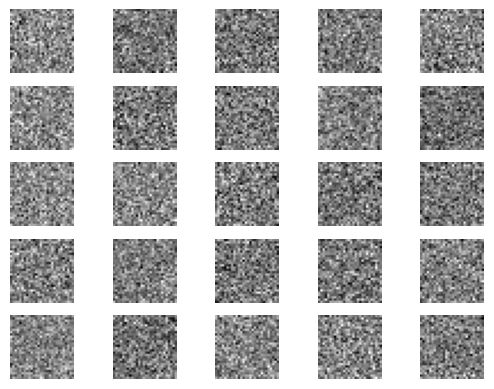

2/2 [==============================] - 0s 5ms/step
100 [D loss: 0.0036480586568359286, acc.: 100.0%] [G loss: 6.418092727661133]
1/1 [==============================] - 0s 26ms/step


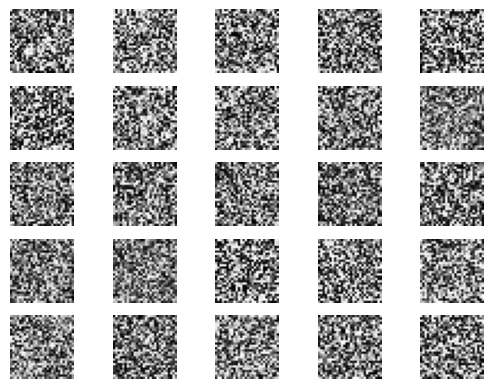

2/2 [==============================] - 0s 5ms/step
200 [D loss: 0.022068683058023453, acc.: 100.0%] [G loss: 5.457086086273193]
1/1 [==============================] - 0s 27ms/step


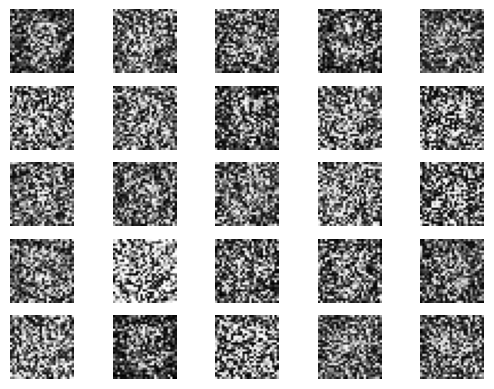

2/2 [==============================] - 0s 5ms/step
300 [D loss: 0.3494882732629776, acc.: 82.8125%] [G loss: 3.2420825958251953]
1/1 [==============================] - 0s 26ms/step


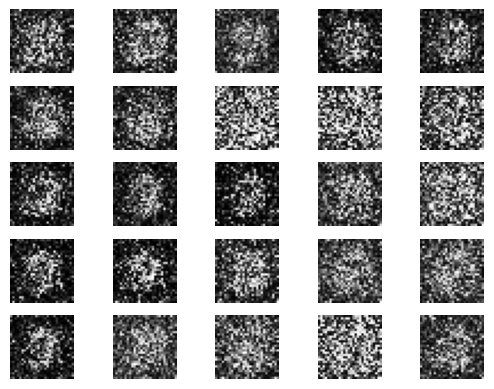

2/2 [==============================] - 0s 5ms/step
400 [D loss: 0.29328785836696625, acc.: 89.84375%] [G loss: 5.0519914627075195]
1/1 [==============================] - 0s 26ms/step


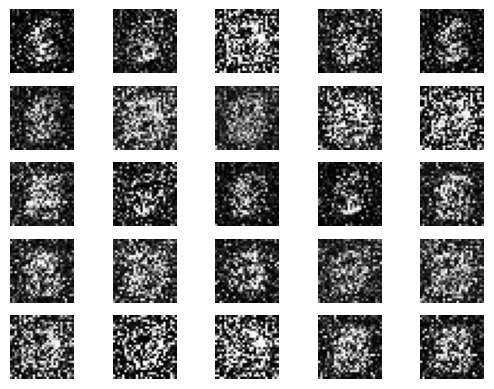

2/2 [==============================] - 0s 5ms/step
500 [D loss: 0.606701672077179, acc.: 64.0625%] [G loss: 2.216526985168457]
1/1 [==============================] - 0s 27ms/step


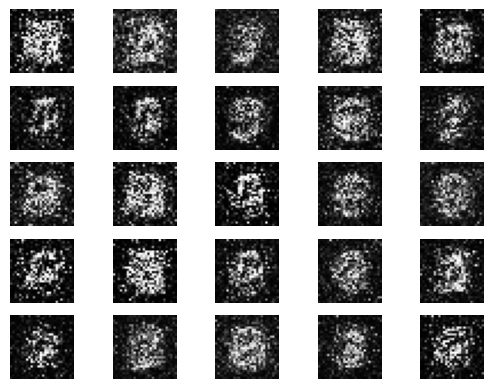

2/2 [==============================] - 0s 5ms/step
600 [D loss: 0.5802566409111023, acc.: 65.625%] [G loss: 1.3900208473205566]
1/1 [==============================] - 0s 27ms/step


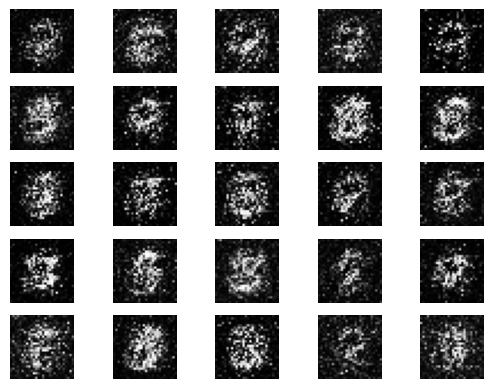

2/2 [==============================] - 0s 5ms/step
700 [D loss: 0.6123938262462616, acc.: 66.40625%] [G loss: 1.1627223491668701]
1/1 [==============================] - 0s 27ms/step


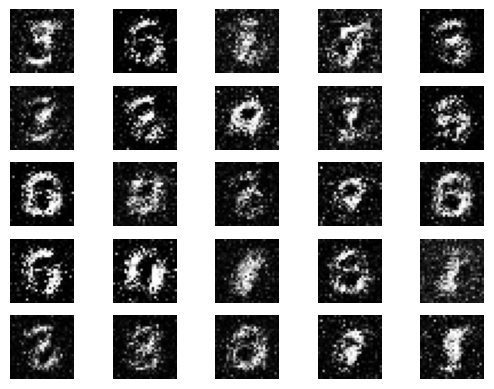

2/2 [==============================] - 0s 5ms/step
800 [D loss: 0.6271808445453644, acc.: 67.1875%] [G loss: 1.1159369945526123]
1/1 [==============================] - 0s 25ms/step


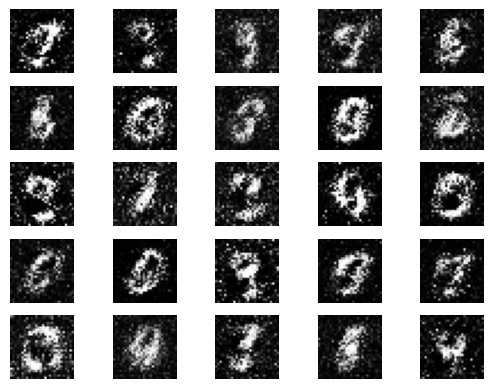

2/2 [==============================] - 0s 5ms/step
900 [D loss: 0.6315123438835144, acc.: 64.0625%] [G loss: 1.1231290102005005]
1/1 [==============================] - 0s 28ms/step


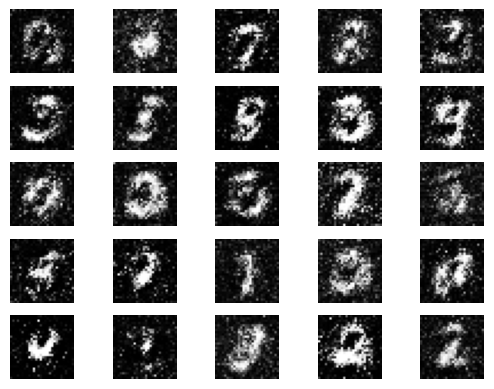

2/2 [==============================] - 0s 5ms/step


In [46]:
# Build models
generator = build_generator()
discriminator = build_discriminator()
gan = build_gan(generator, discriminator)
# Train the GAN
train(epochs=1000, batch_size=64, save_interval=100)

### SGD

In [47]:
# Compile GAN
def build_gan(generator, discriminator):
    discriminator.compile(optimizer = tf.keras.optimizers.SGD(learning_rate=0.0002), loss='binary_crossentropy', metrics=['accuracy'])
    discriminator.trainable = False
    gan_input = layers.Input(shape=(100,))
    generated_img = generator(gan_input)
    gan_output = discriminator(generated_img)
    gan = tf.keras.Model(gan_input, gan_output)
    gan.compile(optimizer=tf.keras.optimizers.Adam(0.0002), loss='binary_crossentropy')
    return gan

In [48]:
# Function to save generated images
def save_imgs(epoch):
    noise = np.random.normal(0, 1, (25, 100))
    gen_imgs = generator.predict(noise)
    gen_imgs = 0.5 * gen_imgs + 0.5  # Rescale to [0, 1]

    fig, axs = plt.subplots(5, 5)
    cnt = 0
    for i in range(5):
        for j in range(5):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

    # Save the figure before showing it
    if not os.path.exists('images'):
        os.makedirs('images')
    fig.savefig(f"images/sgd_prop_epoch_{epoch}.png")

    plt.show()
    plt.close()


2/2 [==============================] - 0s 5ms/step
0 [D loss: 1.0110841393470764, acc.: 46.875%] [G loss: 0.6702917814254761]
1/1 [==============================] - 0s 109ms/step


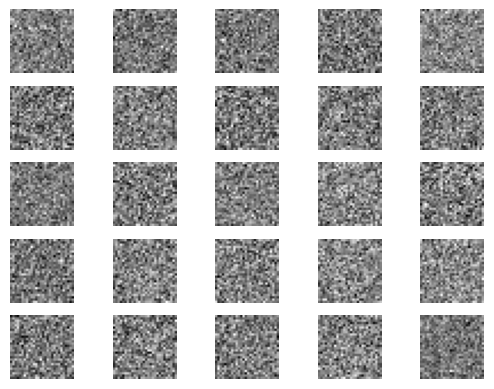

2/2 [==============================] - 0s 5ms/step
100 [D loss: 1.8041584715247154, acc.: 50.0%] [G loss: 0.037804171442985535]
1/1 [==============================] - 0s 30ms/step


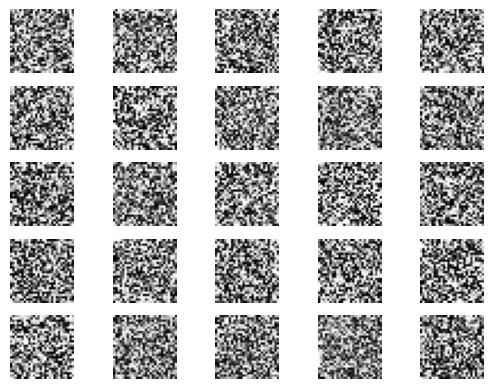

2/2 [==============================] - 0s 5ms/step
200 [D loss: 1.8088988363742828, acc.: 50.0%] [G loss: 0.03281315043568611]
1/1 [==============================] - 0s 32ms/step


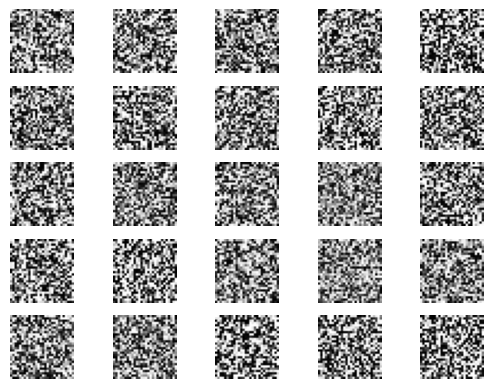

2/2 [==============================] - 0s 5ms/step
300 [D loss: 1.5771637111902237, acc.: 50.0%] [G loss: 0.05431542173027992]
1/1 [==============================] - 0s 27ms/step


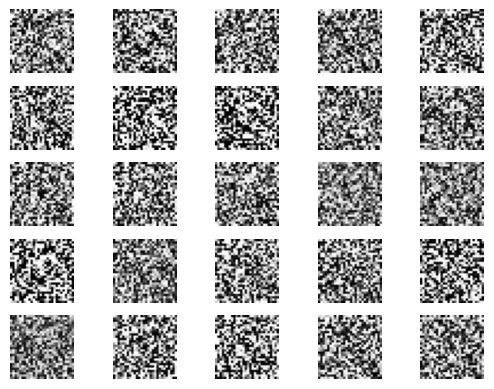

2/2 [==============================] - 0s 6ms/step
400 [D loss: 1.353440783917904, acc.: 50.0%] [G loss: 0.08726048469543457]
1/1 [==============================] - 0s 35ms/step


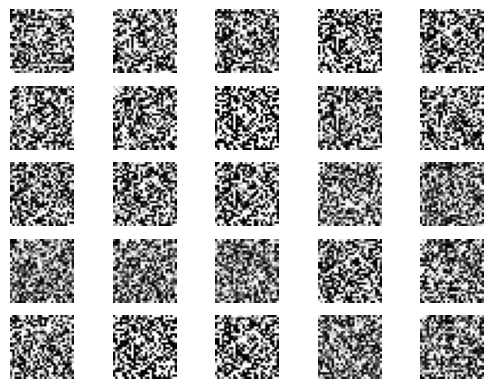

2/2 [==============================] - 0s 5ms/step
500 [D loss: 1.3327175080776215, acc.: 49.21875%] [G loss: 0.10617469996213913]
1/1 [==============================] - 0s 29ms/step


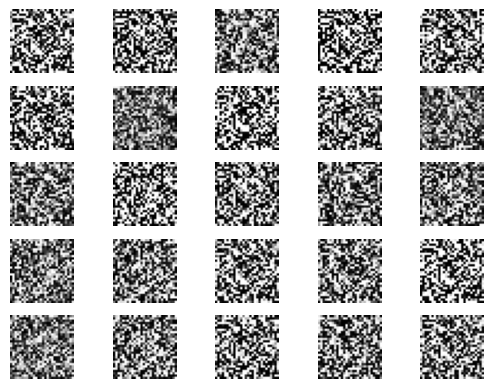

2/2 [==============================] - 0s 5ms/step
600 [D loss: 1.3336858749389648, acc.: 49.21875%] [G loss: 0.10598647594451904]
1/1 [==============================] - 0s 29ms/step


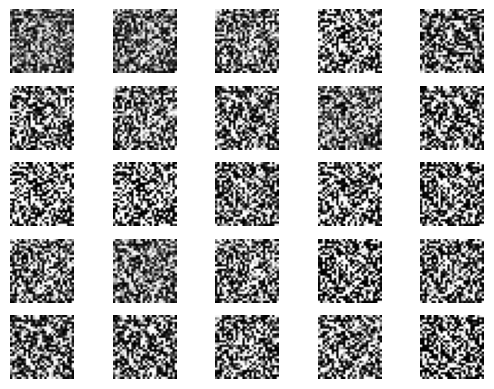

2/2 [==============================] - 0s 5ms/step
700 [D loss: 1.3260593712329865, acc.: 46.875%] [G loss: 0.12492816150188446]
1/1 [==============================] - 0s 32ms/step


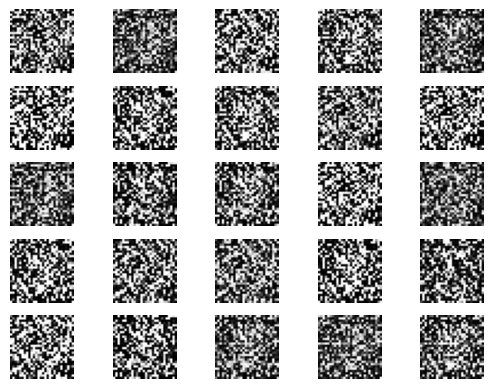

2/2 [==============================] - 0s 5ms/step
800 [D loss: 1.2419922947883606, acc.: 41.40625%] [G loss: 0.15117059648036957]
1/1 [==============================] - 0s 30ms/step


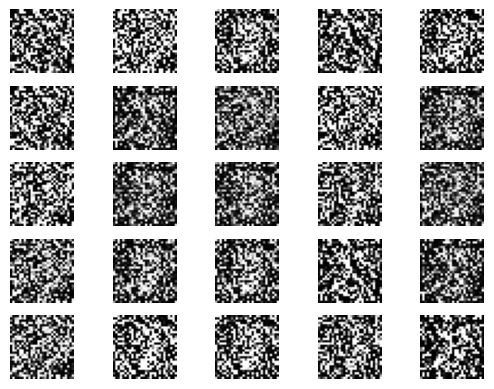

2/2 [==============================] - 0s 5ms/step
900 [D loss: 1.2018240690231323, acc.: 42.96875%] [G loss: 0.16686120629310608]
1/1 [==============================] - 0s 32ms/step


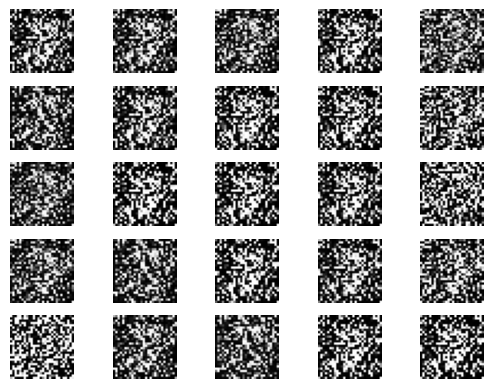

2/2 [==============================] - 0s 5ms/step


In [49]:
# Build models
generator = build_generator()
discriminator = build_discriminator()
gan = build_gan(generator, discriminator)
# Train the GAN
train(epochs=1000, batch_size=64, save_interval=100)

# Question 04
Experiment with different values of the batch_size. What impact does it have on training?

In [50]:
# Generator model
def build_generator():
    model = tf.keras.Sequential()
    model.add(layers.Dense(256, input_dim=100))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.Dense(512))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.Dense(1024))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.Dense(28 * 28 * 1, activation='tanh'))
    model.add(layers.Reshape((28, 28, 1)))
    return model

# Compile GAN
def build_gan(generator, discriminator):
    discriminator.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002), loss='binary_crossentropy', metrics=['accuracy'])
    discriminator.trainable = False
    gan_input = layers.Input(shape=(100,))
    generated_img = generator(gan_input)
    gan_output = discriminator(generated_img)
    gan = tf.keras.Model(gan_input, gan_output)
    gan.compile(optimizer=tf.keras.optimizers.Adam(0.0002), loss='binary_crossentropy')
    return gan

# Discriminator model
def build_discriminator():
    model = tf.keras.Sequential()
    model.add(layers.Flatten(input_shape=(28, 28, 1)))
    model.add(layers.Dense(512))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dense(256))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model


# Function to save generated images
def save_imgs(epoch, batch_size):
    noise = np.random.normal(0, 1, (25, 100))
    gen_imgs = generator.predict(noise)
    gen_imgs = 0.5 * gen_imgs + 0.5  # Rescale to [0, 1]

    fig, axs = plt.subplots(5, 5)
    cnt = 0
    for i in range(5):
        for j in range(5):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1

    # Save the figure before showing it
    if not os.path.exists(f'images/{batch_size}'):
        os.makedirs(f'images/{batch_size}')
    fig.savefig(f"images/{batch_size}/batch_size_{batch_size}_{epoch}.png")

    plt.show()
    plt.close()


# Training function
def train(epochs, batch_size=128, save_interval=200):
    real = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))

    for epoch in range(epochs):
        idx = np.random.randint(0, X_train.shape[0], batch_size)
        real_imgs = X_train[idx]

        noise = np.random.normal(0, 1, (batch_size, 100))
        gen_imgs = generator.predict(noise)

        d_loss_real = discriminator.train_on_batch(real_imgs, real)
        d_loss_fake = discriminator.train_on_batch(gen_imgs, fake)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

        g_loss = gan.train_on_batch(noise, real)

        if epoch % save_interval == 0:
            print(f"{epoch} [D loss: {d_loss[0]}, acc.: {100 * d_loss[1]}%] [G loss: {g_loss}]")
            save_imgs(epoch=epoch, batch_size=batch_size)

1/1 [==============================] - 0s 145ms/step
0 [D loss: 0.7839373350143433, acc.: 32.8125%] [G loss: 0.7623883485794067]
1/1 [==============================] - 0s 113ms/step


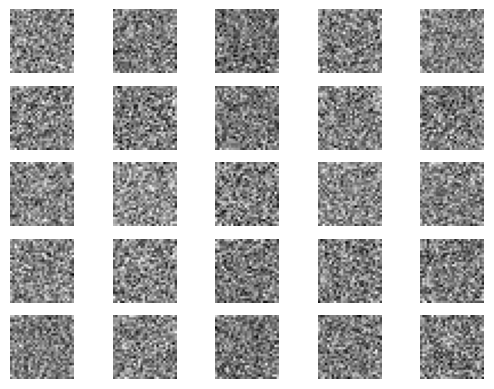

1/1 [==============================] - 0s 25ms/step
100 [D loss: 0.009018537704832852, acc.: 100.0%] [G loss: 4.731590270996094]
1/1 [==============================] - 0s 25ms/step


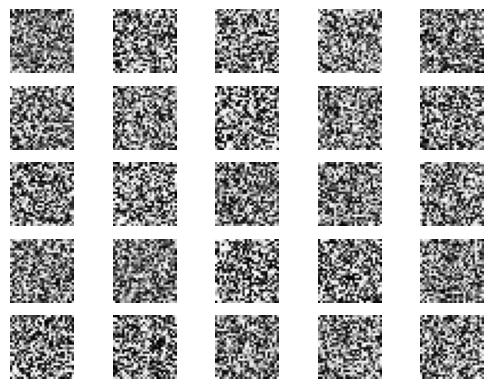

1/1 [==============================] - 0s 29ms/step
200 [D loss: 0.008680126164108515, acc.: 100.0%] [G loss: 5.568550109863281]
1/1 [==============================] - 0s 31ms/step


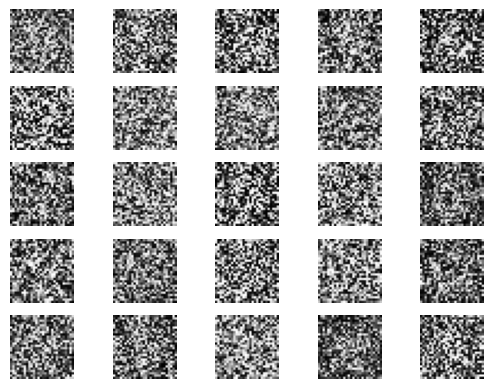

1/1 [==============================] - 0s 25ms/step
300 [D loss: 0.07761691510677338, acc.: 98.4375%] [G loss: 4.926889896392822]
1/1 [==============================] - 0s 25ms/step


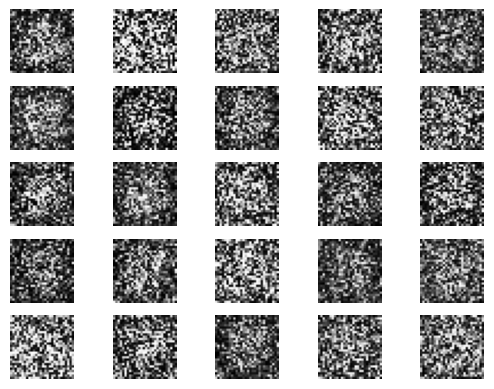

1/1 [==============================] - 0s 25ms/step
400 [D loss: 0.041019221767783165, acc.: 98.4375%] [G loss: 7.78024959564209]
1/1 [==============================] - 0s 25ms/step


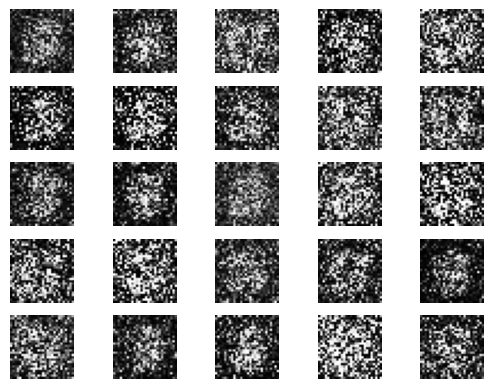

1/1 [==============================] - 0s 28ms/step
500 [D loss: 0.05531511828303337, acc.: 98.4375%] [G loss: 5.987691879272461]
1/1 [==============================] - 0s 32ms/step


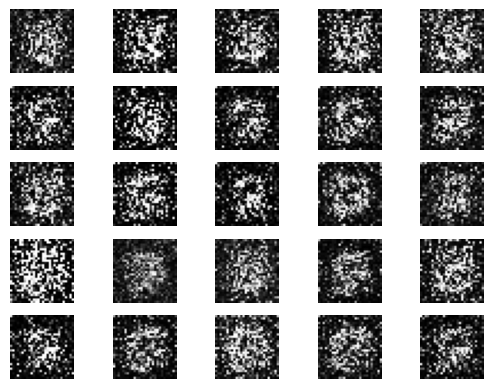

1/1 [==============================] - 0s 24ms/step
600 [D loss: 0.6040152735076845, acc.: 76.5625%] [G loss: 2.7100491523742676]
1/1 [==============================] - 0s 25ms/step


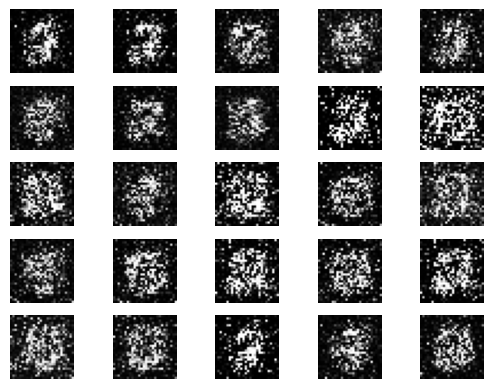

1/1 [==============================] - 0s 25ms/step
700 [D loss: 0.16631150990724564, acc.: 95.3125%] [G loss: 3.5701584815979004]
1/1 [==============================] - 0s 25ms/step


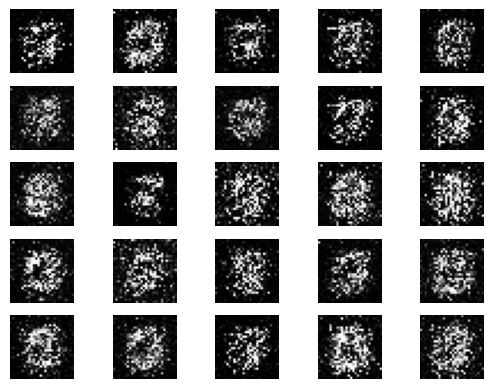

1/1 [==============================] - 0s 29ms/step
800 [D loss: 0.19732752814888954, acc.: 93.75%] [G loss: 4.94661808013916]
1/1 [==============================] - 0s 29ms/step


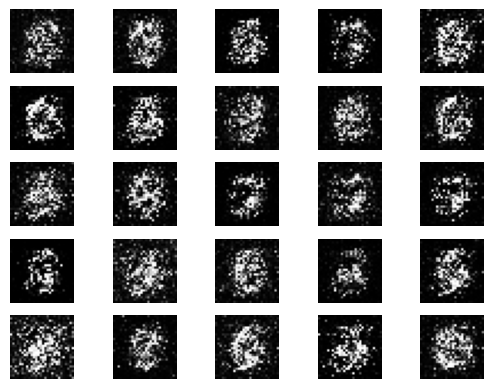

1/1 [==============================] - 0s 24ms/step
900 [D loss: 0.2867967188358307, acc.: 82.8125%] [G loss: 3.541999101638794]
1/1 [==============================] - 0s 26ms/step


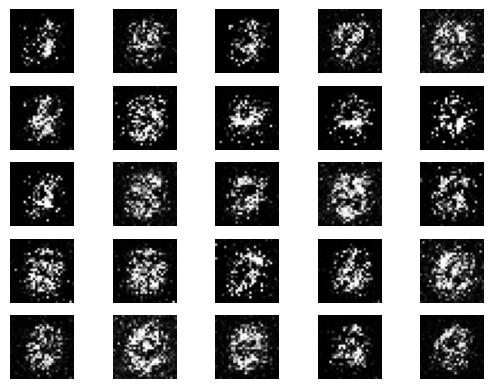

2/2 [==============================] - 0s 5ms/step
0 [D loss: 0.2550785765051842, acc.: 88.28125%] [G loss: 3.2483696937561035]
1/1 [==============================] - 0s 27ms/step


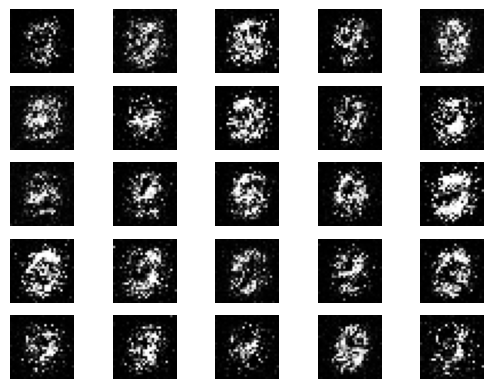

2/2 [==============================] - 0s 5ms/step
100 [D loss: 0.2858595922589302, acc.: 92.1875%] [G loss: 3.189643621444702]
1/1 [==============================] - 0s 25ms/step


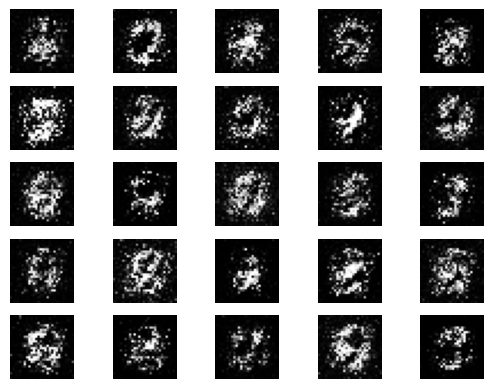

2/2 [==============================] - 0s 5ms/step
200 [D loss: 0.31184758245944977, acc.: 85.9375%] [G loss: 3.8925492763519287]
1/1 [==============================] - 0s 26ms/step


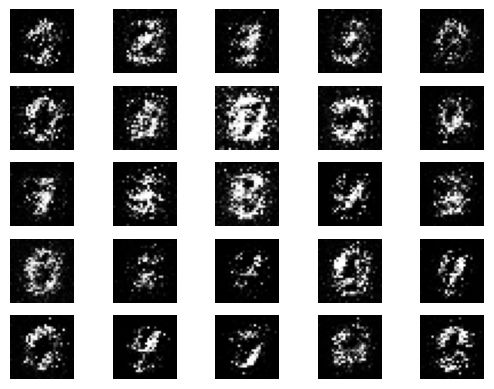

2/2 [==============================] - 0s 5ms/step
300 [D loss: 0.3708256632089615, acc.: 80.46875%] [G loss: 2.7558743953704834]
1/1 [==============================] - 0s 26ms/step


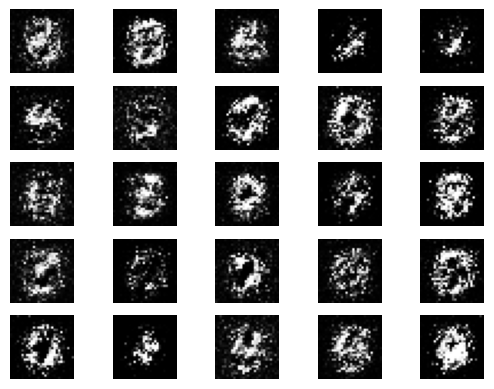

2/2 [==============================] - 0s 5ms/step
400 [D loss: 0.34437334537506104, acc.: 85.9375%] [G loss: 3.1313695907592773]
1/1 [==============================] - 0s 27ms/step


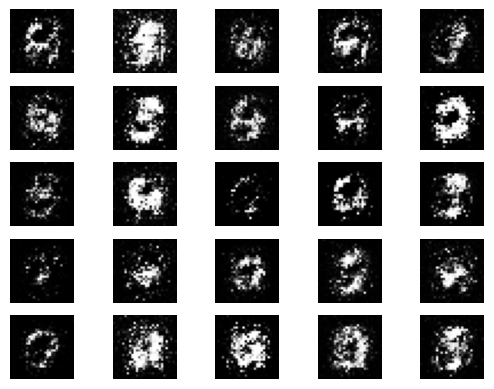

2/2 [==============================] - 0s 5ms/step
500 [D loss: 0.4969489425420761, acc.: 77.34375%] [G loss: 2.6525778770446777]
1/1 [==============================] - 0s 25ms/step


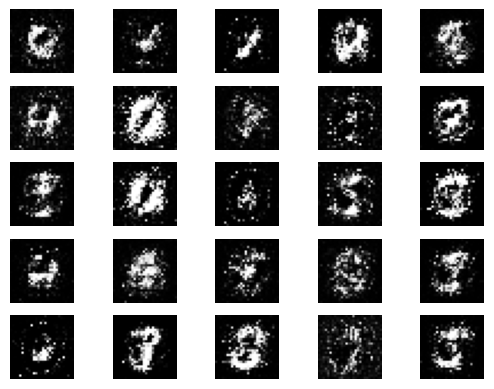

2/2 [==============================] - 0s 5ms/step
600 [D loss: 0.29888951778411865, acc.: 86.71875%] [G loss: 2.7489559650421143]
1/1 [==============================] - 0s 26ms/step


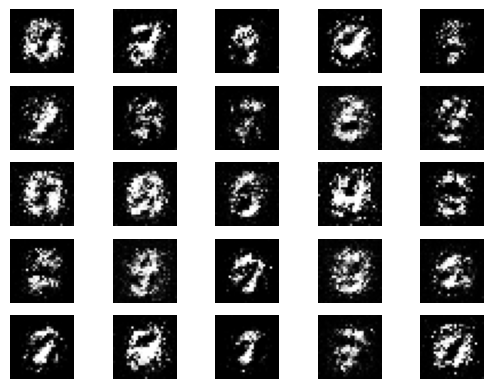

2/2 [==============================] - 0s 6ms/step
700 [D loss: 0.5262518525123596, acc.: 74.21875%] [G loss: 1.997246265411377]
1/1 [==============================] - 0s 25ms/step


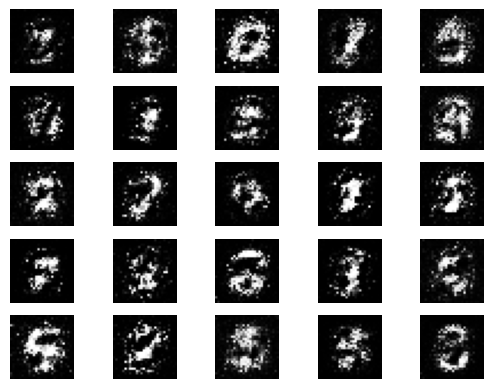

2/2 [==============================] - 0s 5ms/step
800 [D loss: 0.35380594432353973, acc.: 89.0625%] [G loss: 2.9193053245544434]
1/1 [==============================] - 0s 27ms/step


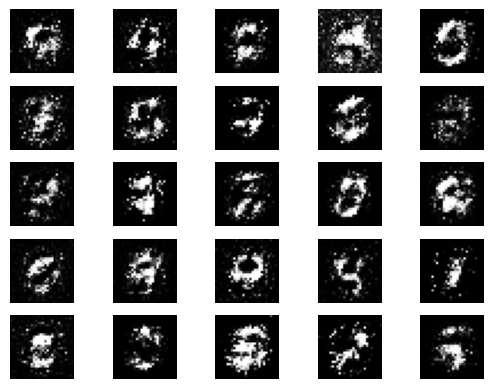

2/2 [==============================] - 0s 5ms/step
900 [D loss: 0.5352088809013367, acc.: 75.0%] [G loss: 2.0475282669067383]
1/1 [==============================] - 0s 27ms/step


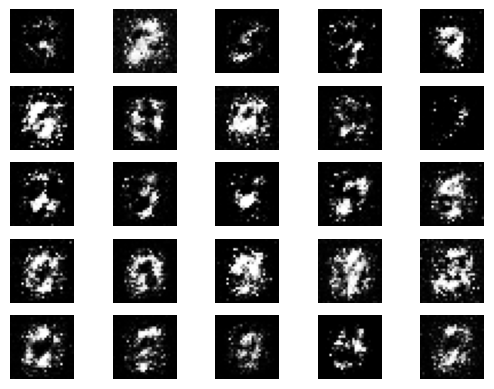

4/4 [==============================] - 0s 4ms/step
0 [D loss: 0.6491580605506897, acc.: 64.453125%] [G loss: 1.8359503746032715]
1/1 [==============================] - 0s 25ms/step


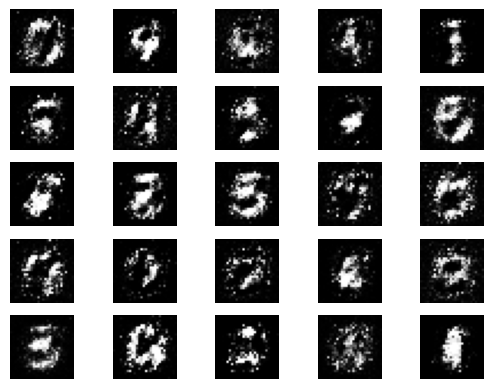

4/4 [==============================] - 0s 4ms/step
100 [D loss: 0.5923207402229309, acc.: 67.96875%] [G loss: 1.92331063747406]
1/1 [==============================] - 0s 27ms/step


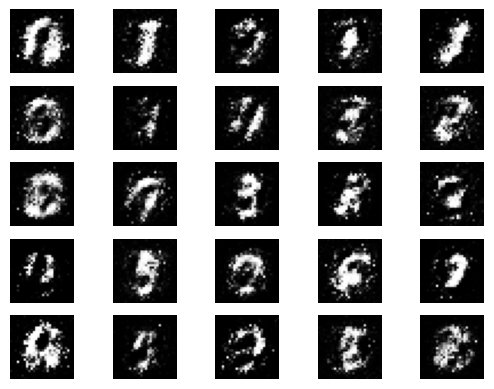

4/4 [==============================] - 0s 4ms/step
200 [D loss: 0.6227749884128571, acc.: 67.1875%] [G loss: 1.771384358406067]
1/1 [==============================] - 0s 28ms/step


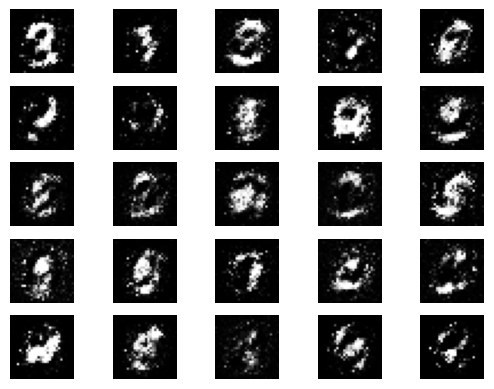

4/4 [==============================] - 0s 4ms/step
300 [D loss: 0.5240095257759094, acc.: 75.78125%] [G loss: 1.7695739269256592]
1/1 [==============================] - 0s 28ms/step


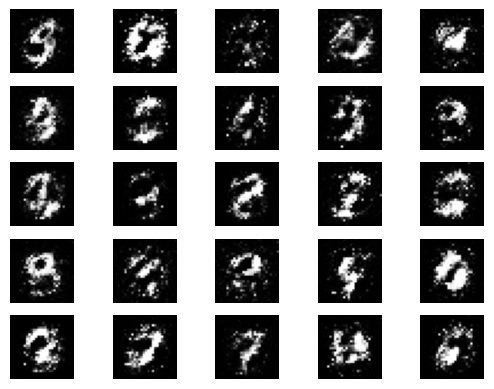

4/4 [==============================] - 0s 4ms/step
400 [D loss: 0.6293167173862457, acc.: 65.234375%] [G loss: 1.5538052320480347]
1/1 [==============================] - 0s 25ms/step


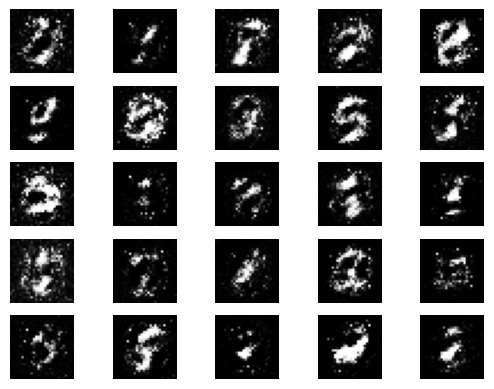

4/4 [==============================] - 0s 4ms/step
500 [D loss: 0.544574499130249, acc.: 71.875%] [G loss: 1.6305229663848877]
1/1 [==============================] - 0s 28ms/step


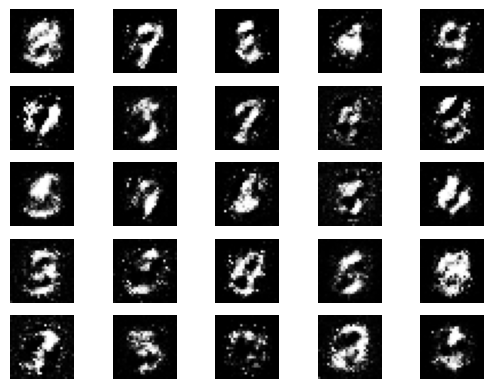

4/4 [==============================] - 0s 4ms/step
600 [D loss: 0.6193072199821472, acc.: 69.53125%] [G loss: 1.5018863677978516]
1/1 [==============================] - 0s 25ms/step


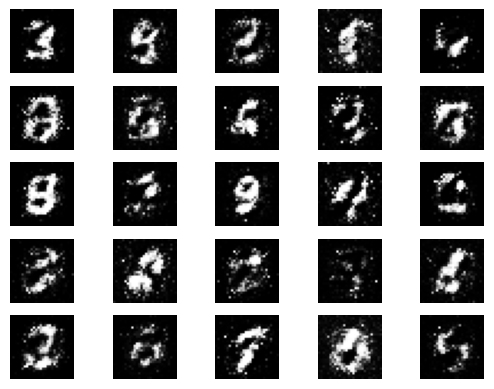

4/4 [==============================] - 0s 3ms/step
700 [D loss: 0.6097078025341034, acc.: 71.484375%] [G loss: 1.766440987586975]
1/1 [==============================] - 0s 25ms/step


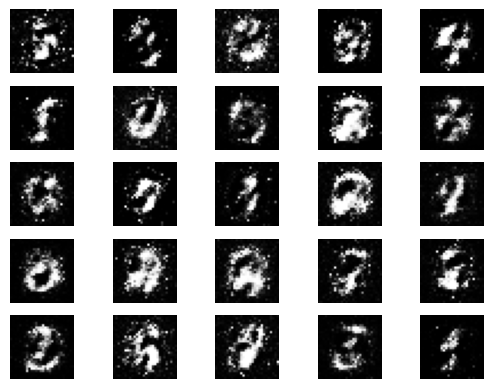

4/4 [==============================] - 0s 3ms/step
800 [D loss: 0.5183917880058289, acc.: 76.953125%] [G loss: 1.7318050861358643]
1/1 [==============================] - 0s 27ms/step


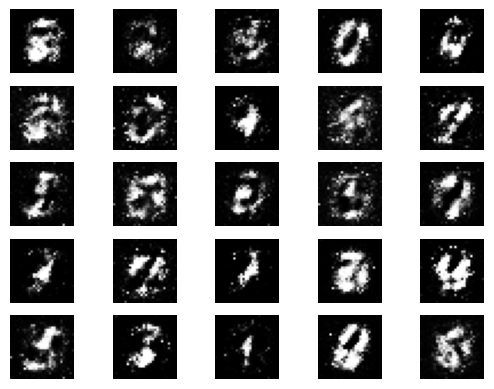

4/4 [==============================] - 0s 4ms/step
900 [D loss: 0.7424665093421936, acc.: 58.59375%] [G loss: 1.1515021324157715]
1/1 [==============================] - 0s 27ms/step


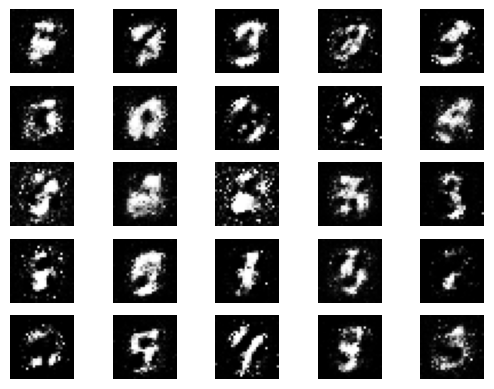

8/8 [==============================] - 0s 3ms/step
0 [D loss: 0.48469746112823486, acc.: 77.5390625%] [G loss: 1.6566789150238037]
1/1 [==============================] - 0s 26ms/step


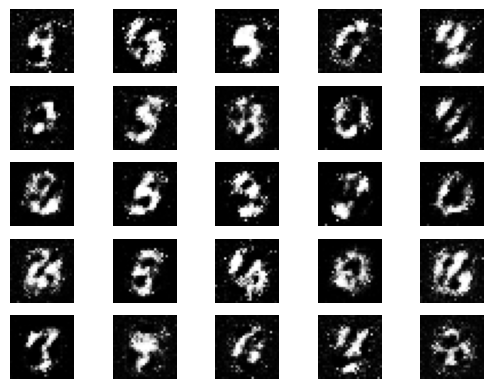

8/8 [==============================] - 0s 3ms/step
100 [D loss: 0.7704721093177795, acc.: 54.6875%] [G loss: 1.094000220298767]
1/1 [==============================] - 0s 27ms/step


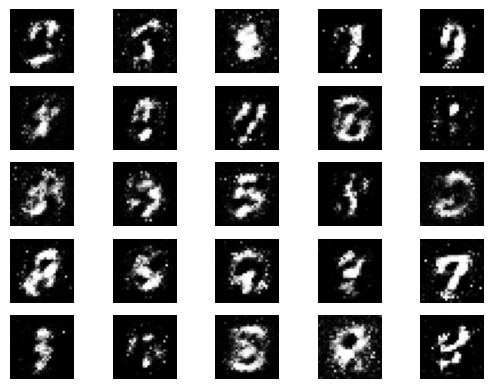

8/8 [==============================] - 0s 3ms/step
200 [D loss: 0.601557582616806, acc.: 66.6015625%] [G loss: 1.2678616046905518]
1/1 [==============================] - 0s 27ms/step


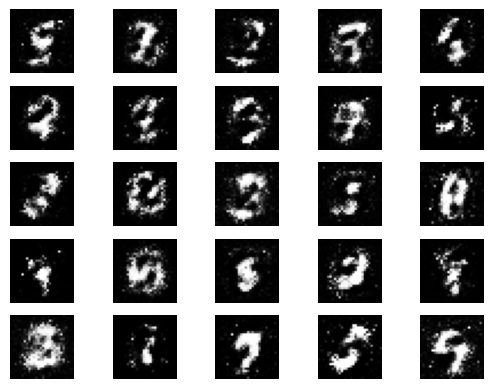

8/8 [==============================] - 0s 3ms/step
300 [D loss: 0.6509719789028168, acc.: 62.6953125%] [G loss: 1.1109366416931152]
1/1 [==============================] - 0s 25ms/step


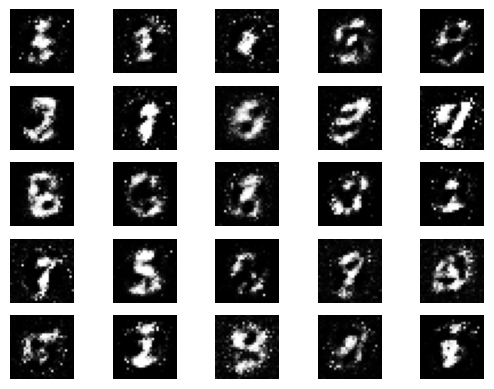

8/8 [==============================] - 0s 3ms/step
400 [D loss: 0.6486731767654419, acc.: 63.4765625%] [G loss: 1.1961863040924072]
1/1 [==============================] - 0s 30ms/step


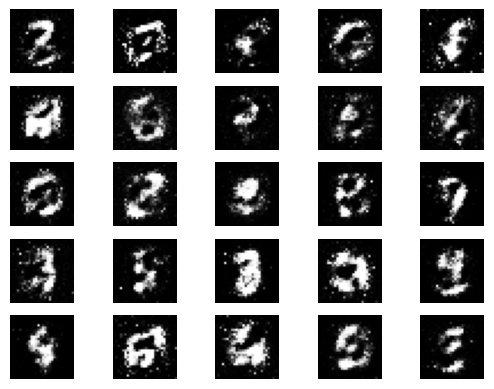

8/8 [==============================] - 0s 3ms/step
500 [D loss: 0.5236941874027252, acc.: 75.0%] [G loss: 1.287436604499817]
1/1 [==============================] - 0s 29ms/step


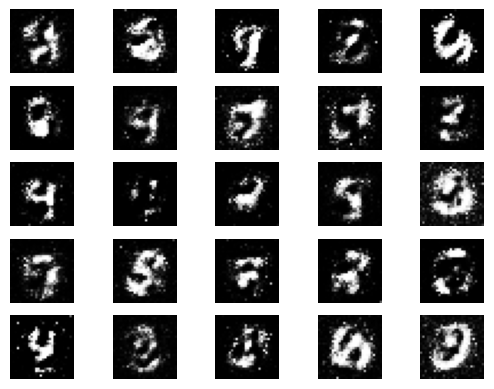

8/8 [==============================] - 0s 3ms/step
600 [D loss: 0.672905832529068, acc.: 61.9140625%] [G loss: 1.164884328842163]
1/1 [==============================] - 0s 27ms/step


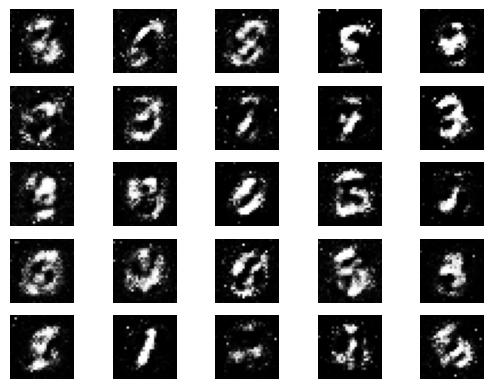

8/8 [==============================] - 0s 3ms/step
700 [D loss: 0.5165529251098633, acc.: 77.34375%] [G loss: 1.4051783084869385]
1/1 [==============================] - 0s 28ms/step


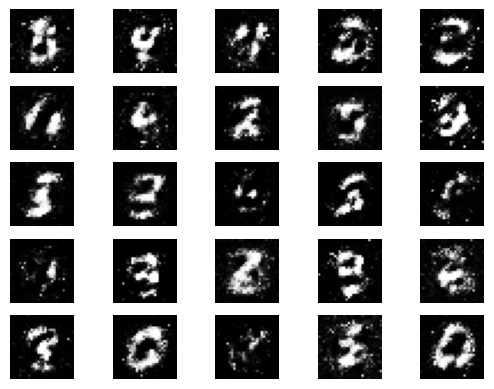

8/8 [==============================] - 0s 3ms/step
800 [D loss: 0.7943024635314941, acc.: 50.78125%] [G loss: 0.9060381650924683]
1/1 [==============================] - 0s 27ms/step


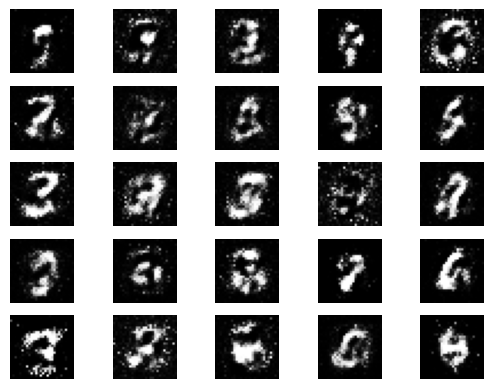

8/8 [==============================] - 0s 3ms/step
900 [D loss: 0.5603251755237579, acc.: 72.4609375%] [G loss: 1.237396240234375]
1/1 [==============================] - 0s 27ms/step


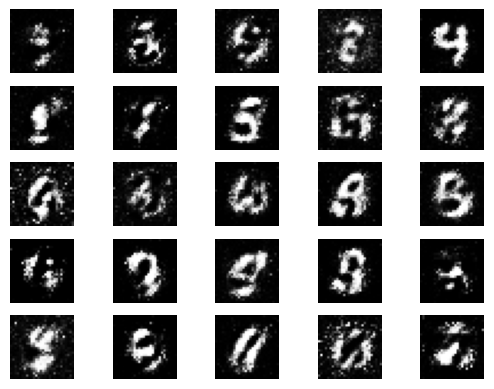

8/8 [==============================] - 0s 3ms/step


In [52]:
# Build models
generator = build_generator()
discriminator = build_discriminator()
gan = build_gan(generator, discriminator)

batch_sizes = [32, 64, 128, 256]
# Train the GAN
for batch_size in batch_sizes:
  train(epochs=1000, batch_size=batch_size, save_interval=100)

In [54]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive
